# Data Preparation

In [1]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

In [2]:
df = pd.read_csv("../test_data/LV_spectra/Lv20K.csv")

In [3]:
df.shape

(212, 650)

### Data normalization

In [4]:
scaler = MinMaxScaler()
df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)

### Data visualization

In [7]:
import plotly.express as px
fig = px.imshow(df, 
                color_continuous_scale='Viridis',  # Цветовая схема
                labels=dict(x="Columns", y="Rows", color="Values"))

# Показываем фигуру
fig.show()

## Curve selection

In [8]:
df_selected = df.iloc[:180, 200:370]

In [9]:
df_selected.shape

(180, 170)

## Curve resize

In [29]:
from skimage.transform import resize

# Растягиваем картину на размер 256x256
resized_image = resize(df_selected.values, (256, 256), mode='reflect', anti_aliasing=True)


# Преобразуем обратно в DataFrame
df_resized = pd.DataFrame(resized_image).iloc[::-1].reset_index(drop=True)

# Печатаем результат
print(df_resized.shape)

(256, 256)


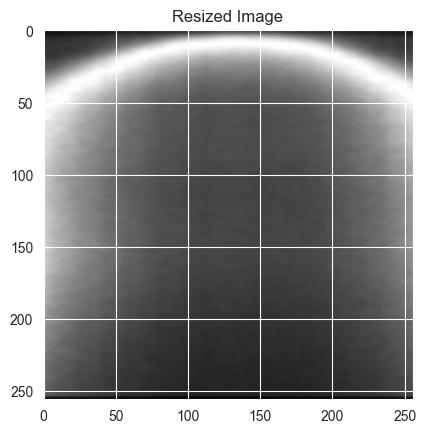

In [30]:
import matplotlib.pyplot as plt

plt.imshow(df_resized, cmap='gray')
plt.title("Resized Image")
plt.show()

# Model prediction

In [31]:
import torch.nn as nn
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = nn.Sequential(
    nn.Conv2d(1, 8, (5, 5), padding=2),
    nn.ReLU(True),
    nn.MaxPool2d(2),
    nn.Conv2d(8, 16, (3, 3), padding=1),
    nn.ReLU(True),
    nn.MaxPool2d(4),
    nn.Conv2d(16, 32, (3, 3), padding=1),
    nn.ReLU(True),
    nn.MaxPool2d(4),
    nn.Flatten(),
    nn.Linear(32 * 8 * 8, 16 * 4 * 4),
    nn.ReLU(True),
    nn.Linear(16 * 4 * 4, 64),
    nn.ReLU(True),
    nn.Linear(64, 5)
).to(device)

model.load_state_dict(torch.load('model_weights.pth'))

C:\Users\Hikaro\AppData\Local\Temp\ipykernel_2096\1285405671.py:24: FutureWarning:

You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.



<All keys matched successfully>

In [35]:
img_in = torch.tensor(df_resized.values, device=device, dtype=torch.float32).unsqueeze(0).unsqueeze(0)
print(img_in.shape)

with torch.no_grad():
    output = model(img_in)
    
print(output)

torch.Size([1, 1, 256, 256])
tensor([[-2.1285,  1.6567,  8.7151,  0.1166, 10.0506]], device='cuda:0')


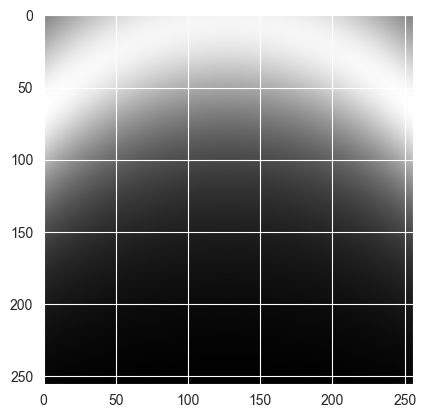

In [33]:
from diplom.functions import generate_spectre_by_values

plt.imshow(generate_spectre_by_values(output[0])[0][0], cmap='gray')